### Imports

In [1]:
import torch
import torch.nn as nn

import torchvision
import torchvision.transforms as transforms

from tqdm.notebook import tqdm

import matplotlib.pyplot as plt

In [2]:
import numpy as np
from math import ceil, sqrt

def show_images(images, labels=None, title=None, transform=None, figsize=(12, 12)):
    fig = plt.figure(figsize=figsize, linewidth=5)
    grid_val = ceil(sqrt(len(images)))
    grid_specs = plt.GridSpec(grid_val, grid_val)
    
    for i, image in enumerate(images):
        ax = fig.add_subplot(grid_specs[i // grid_val, i % grid_val])
        ax.axis('off')
        
        if transform is not None:
            image = transform(image)
        
        if labels is not None:
            ax_title = labels[i]
        else:
            ax_title = '#{}'.format(i+1)
            
        ax.set_title(ax_title)
        ax.imshow(image, cmap='gray')
            
    if title:
        fig.suptitle(title, y=0.93, fontsize='xx-large')
    plt.show()

In [3]:
num_workers = 2
batch_size = 64

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using {} device'.format(device))

Using cuda device


### Data loading

In [4]:
transform = transforms.Compose([
    transforms.ToTensor()
])

train_data = torchvision.datasets.FashionMNIST(
    root='./data', train=True, download=True, 
    transform=transform
)

test_data = torchvision.datasets.FashionMNIST(
    root='./data', train=False, download=True, 
    transform=transform
)

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



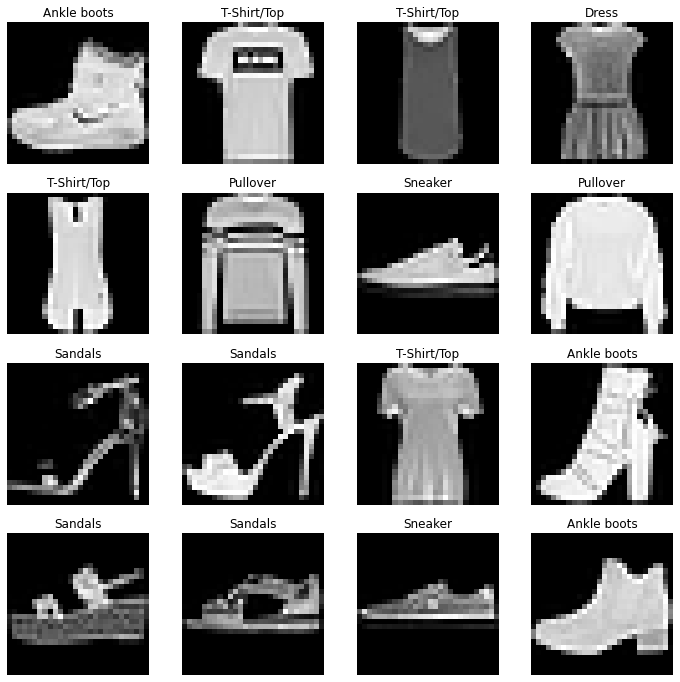

In [19]:
train_dataloader = torch.utils.data.DataLoader(
    train_data, shuffle=False, 
    batch_size=batch_size, num_workers=num_workers
)

test_dataloader = torch.utils.data.DataLoader(
    test_data, shuffle=False, 
    batch_size=batch_size, num_workers=num_workers
)

labels_map = {
    0: "T-Shirt/Top",
    1: "Trouser",
    2: "Pullover",
    3: "Dress",
    4: "Coat",
    5: "Sandals",
    6: "Shirt",
    7: "Sneaker",
    8: "Bag",
    9: "Ankle boots",
}

N_samples = 16
images, labels = next(iter(train_dataloader))
show_images(
    images[:N_samples], 
    [labels_map[i.item()] for i in labels[:N_samples]], 
    transform=transforms.ToPILImage()
)

### Train and test loops

In [34]:
import IPython
from IPython.display import clear_output

def train_loop(model, dataloader, loss_fn, optimizer, step=0.05):
    out = display(IPython.display.Pretty('Learning...'), display_id=True)

    size = len(dataloader.dataset) 
    len_size = len(str(size))
    train_loss, correct = 0, 0
    batches = ceil(size / dataloader.batch_size) - 1

    percentage = 0
    for batch, (X, y) in enumerate(tqdm(dataloader, leave=False, desc="Batch #")):
        X, y = X.to(device), y.to(device)

        pred = model(X)
        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        correct += (pred.argmax(1) == y).type(torch.float).sum().item()

        if batch / batches > percentage or batch == batches: 
            out.update(f'[{int(percentage * size)}/{size}] Loss: {loss:>8f}')
            percentage += step

    train_loss /= batches
    correct /= size

    history['train_loss'].append(train_loss)
    history['train_acc'].append(correct)

    return history
        
        
def test_loop(model, dataloader, loss_fn):

    size = len(dataloader.dataset)
    test_loss, correct = 0, 0
    batches = ceil(size / dataloader.batch_size)

    with torch.no_grad():
        for batch, (X, y) in enumerate(tqdm(dataloader, leave=False, desc="Batch #")):
            X, y = X.to(device), y.to(device)

            pred = model(X)

            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

    test_loss /= batches
    correct /= size

    history['val_loss'].append(test_loss)
    history['val_acc'].append(correct)
    
    print(f"Validation accuracy: {(100*correct):>0.1f}%, Validation loss: {test_loss:>8f} \n")
    return history

### Model - multilayer perceptron

In [30]:
class MLP(nn.Module):
    def __init__(self, in_shape, n_classes, blocks=[32, 64, 32]):
        super().__init__()

        in_features = [np.prod(in_shape), *blocks]
        out_features = [*blocks, n_classes]
        
        self.flatten = nn.Flatten()

        self.stack = nn.Sequential(*[
            nn.Sequential(
                nn.Linear(in_features[idx], out_features[idx]),
                nn.ReLU(),
            )
            for idx in range(len(blocks) + 1)
        ])
        
        
    def forward(self, X):
        return self.stack(self.flatten(X))

### Teacher models training

In [37]:
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

models = []

num_repeats = 10

for i in range(num_repeats):
    clear_output()
    print(f"Model {i+1}\n-------------------------------"
                      "\n-------------------------------")

    torch.manual_seed(i)

    model = MLP(images[0].shape, n_classes=len(labels_map)).to(device)
    loss_fn = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    epochs = 10

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}\n-------------------------------")

        train_loop(model, train_dataloader, loss_fn, optimizer)
        test_loop(model, test_dataloader, loss_fn)

    models.append(model)

Model 10
-------------------------------
-------------------------------
Epoch 1
-------------------------------


'[60000/60000] Loss: 1.224524'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 51.4%, Validation loss: 1.288360 

Epoch 2
-------------------------------


'[60000/60000] Loss: 1.117078'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 53.4%, Validation loss: 1.209690 

Epoch 3
-------------------------------


'[60000/60000] Loss: 1.067170'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 54.6%, Validation loss: 1.168543 

Epoch 4
-------------------------------


'[60000/60000] Loss: 1.028391'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 55.6%, Validation loss: 1.144238 

Epoch 5
-------------------------------


'[60000/60000] Loss: 1.011038'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 56.2%, Validation loss: 1.127882 

Epoch 6
-------------------------------


'[60000/60000] Loss: 0.994799'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 56.7%, Validation loss: 1.115938 

Epoch 7
-------------------------------


'[60000/60000] Loss: 0.976563'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 56.9%, Validation loss: 1.106668 

Epoch 8
-------------------------------


'[60000/60000] Loss: 0.958878'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 57.2%, Validation loss: 1.099056 

Epoch 9
-------------------------------


'[60000/60000] Loss: 0.937632'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 57.2%, Validation loss: 1.092955 

Epoch 10
-------------------------------


'[60000/60000] Loss: 0.917175'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 57.4%, Validation loss: 1.087940 



In [40]:
def plot_history():
    x = np.arange(1, epochs * num_repeats + 1)

    fig, (ax1, ax2) = plt.subplots(1, 2, sharex=True, figsize=(20, 10))
    ax1.plot(x, history['train_loss'], label='Train')
    ax1.plot(x, history['val_loss'], label='Val')
    ax1.set_title('Loss', fontsize=16)
    ax1.legend(fontsize=14)

    ax2.plot(x, history['train_acc'], label='Train')
    ax2.plot(x, history['val_acc'], label='Val')
    ax2.set_title('Accuracy', fontsize=16)
    ax2.legend(fontsize=14)

    fig.text(0.5, 0.04, 'Epoch', ha='center', fontsize=14)

    plt.show()

### Plots quality stats for debug (every 10 epochs on the plot training a new model)

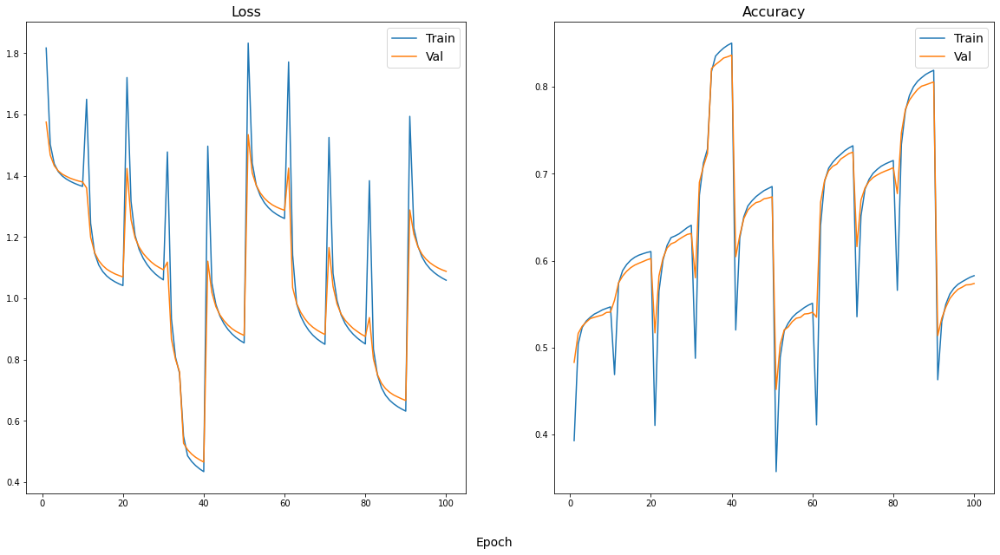

In [41]:
plot_history()

In [ ]:
model

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (stack): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=32, bias=True)
      (1): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=32, out_features=64, bias=True)
      (1): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=64, out_features=32, bias=True)
      (1): ReLU()
    )
    (3): Sequential(
      (0): Linear(in_features=32, out_features=10, bias=True)
      (1): ReLU()
    )
  )
)

### Code for weight extention for this particular case

`TODO` more general case

In [73]:
def change_weights(student_model, teacher_model, mode):
    if mode == 'zero':
        gen_weights = torch.zeros
    elif mode == 'uniform':
        gen_weights = lambda *x: torch.rand(x) / 1000

    student_model.stack[0][0].weight = nn.Parameter(torch.cat((gen_weights(32, 784).to(device),
                                                               teacher_model.stack[0][0].weight)))
    student_model.stack[0][0].bias = nn.Parameter(torch.cat((gen_weights(32).to(device), 
                                                             teacher_model.stack[0][0].bias)))

In [74]:
def train(model, optimizer):
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}\n-------------------------------")

        train_loop(model, train_dataloader, loss_fn, optimizer)
        test_loop(model, test_dataloader, loss_fn)

### Code for training models with different kinds of initialization

In [81]:
scratch_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
zero_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
uniform_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

epochs = 10
loss_fn = nn.CrossEntropyLoss()

for i in range(num_repeats):
    clear_output()

    torch.manual_seed(i + num_repeats)

    print(f"Scratch model {i+1}\n-------------------------------"
                              "\n-------------------------------")

    scratch_model = MLP(images[0].shape, n_classes=len(labels_map), blocks=[64, 64, 32]).to(device)
    optimizer = torch.optim.Adam(scratch_model.parameters(), lr=1e-4)

    history = scratch_history
    train(scratch_model, optimizer)
    clear_output()

    print(f"Student model zero {i+1}\n-------------------------------"
                              "\n-------------------------------")

    student_model_zero = MLP(images[0].shape, n_classes=len(labels_map), blocks=[64, 64, 32]).to(device)
    change_weights(student_model_zero, models[i], 'zero')
    optimizer = torch.optim.Adam(student_model_zero.parameters(), lr=1e-4)

    history = zero_history
    train(student_model_zero, optimizer)
    clear_output()


    print(f"Student model uniform {i+1}\n-------------------------------"
                              "\n-------------------------------")

    student_model_uni = MLP(images[0].shape, n_classes=len(labels_map), blocks=[64, 64, 32]).to(device)
    change_weights(student_model_uni, models[i], 'uniform')
    optimizer = torch.optim.Adam(student_model_uni.parameters(), lr=1e-4)

    history = uniform_history
    train(student_model_uni, optimizer)

Student model uniform 10
-------------------------------
-------------------------------
Epoch 1
-------------------------------


'[60000/60000] Loss: 1.464694'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 63.7%, Validation loss: 1.166261 

Epoch 2
-------------------------------


'[60000/60000] Loss: 1.367833'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 64.2%, Validation loss: 1.092158 

Epoch 3
-------------------------------


'[60000/60000] Loss: 1.312351'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 64.6%, Validation loss: 1.064202 

Epoch 4
-------------------------------


'[60000/60000] Loss: 1.278601'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 64.8%, Validation loss: 1.048106 

Epoch 5
-------------------------------


'[60000/60000] Loss: 1.249540'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 65.0%, Validation loss: 1.036585 

Epoch 6
-------------------------------


'[60000/60000] Loss: 1.238613'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 65.1%, Validation loss: 1.028987 

Epoch 7
-------------------------------


'[60000/60000] Loss: 1.221624'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 65.2%, Validation loss: 1.022185 

Epoch 8
-------------------------------


'[60000/60000] Loss: 1.209422'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 65.3%, Validation loss: 1.016845 

Epoch 9
-------------------------------


'[60000/60000] Loss: 1.195434'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 65.3%, Validation loss: 1.012158 

Epoch 10
-------------------------------


'[60000/60000] Loss: 1.183171'

Batch #:   0%|          | 0/938 [00:00<?, ?it/s]

Batch #:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy: 65.4%, Validation loss: 1.008132 



### For plotting results

In [110]:
def plot_variance(histories, labels, field_name, epoch_size, xlabel='', ylabel='', filename='file'):
    plt.rcParams['font.family'] = 'DejaVu Serif'
    plt.rcParams['lines.linewidth'] = 2
    plt.rcParams['lines.markersize'] = 12
    plt.rcParams['xtick.labelsize'] = 24
    plt.rcParams['ytick.labelsize'] = 24
    plt.rcParams['legend.fontsize'] = 24
    plt.rcParams['axes.titlesize'] = 36
    plt.rcParams['axes.labelsize'] = 24

    x = np.arange(1, epoch_size + 1)

    plt.figure(figsize=(12, 10))

    for history, label in zip(histories, labels):
        data = torch.Tensor(history[field_name]).reshape(-1, epoch_size)
        plt.plot(x, data.mean(axis=0), label=label)
        plt.fill_between(x, data.min(axis=0).values, data.max(axis=0).values, alpha=0.3)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.savefig(f'{filename}.eps', transparent=True)
    plt.savefig(f'{filename}.png')
    plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


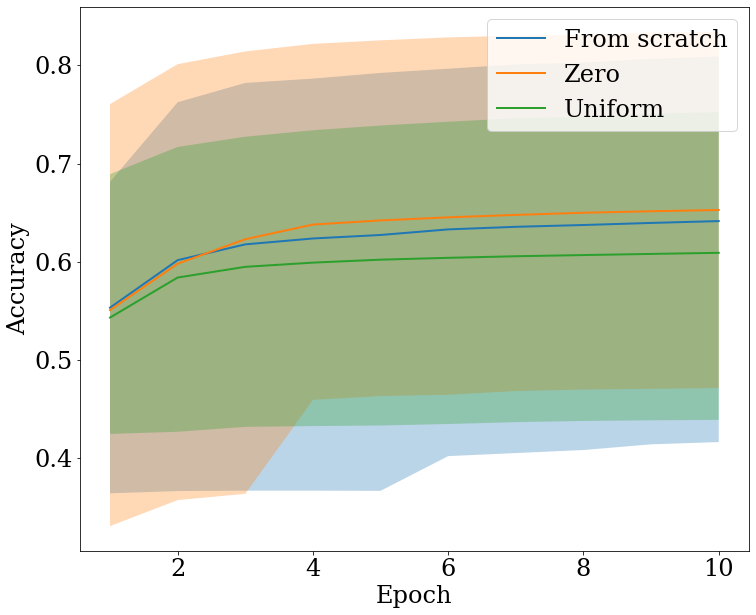

In [113]:
plot_variance([scratch_history, zero_history, uniform_history], ['From scratch', 'Zero', 'Uniform'], 'val_acc', 10, 'Epoch', 'Accuracy', 'accuracy')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


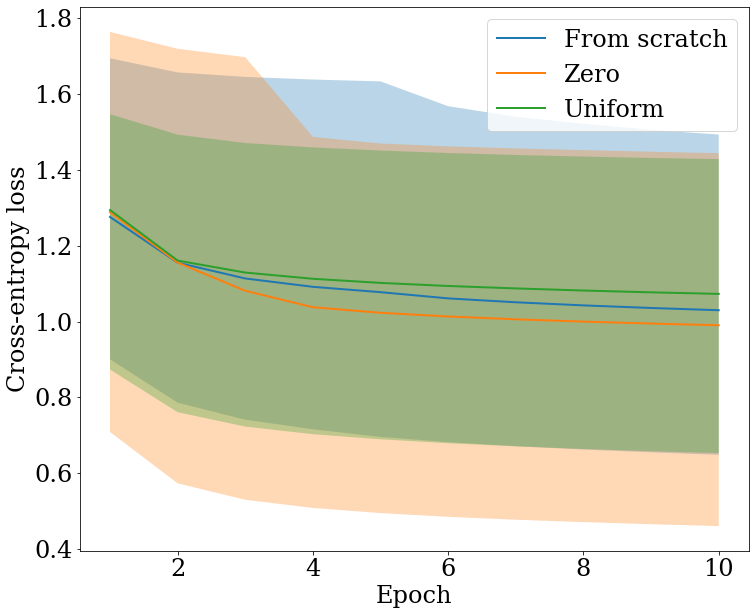

In [114]:
plot_variance([scratch_history, zero_history, uniform_history], ['From scratch', 'Zero', 'Uniform'], 'val_loss', 10, 'Epoch', 'Cross-entropy loss', 'loss')